# Behavioral Analysis of Mating Mosquitoes

## Housekeeping

In [1]:
import os
import h5py
import numpy as np

import pandas as pd
import seaborn as sns
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import math
from scipy.special import comb

from scipy.spatial import distance
from scipy.spatial.distance import euclidean

import scipy.stats as stats
import statsmodels.stats.multicomp as mc
import statsmodels.api as sm
import statsmodels.formula.api as smf
from patsy import dmatrices

import logging
import warnings

This cell rename the .h5 files in the directory for better handling.

In [2]:
directory_path = './H5_files_updated_with_mating_matching'

h5_files = [f for f in os.listdir(directory_path) if f.endswith('.h5')]

# Rename each file
for filename in h5_files:
    
    base_name, extension = os.path.splitext(filename)
    
    
    new_base_name = base_name.replace('.', '_')
    
    
    new_filename = new_base_name + extension
    
    
    os.rename(os.path.join(directory_path, filename),
              os.path.join(directory_path, new_filename))
    
print(f"Processed {len(h5_files)} files successfully")

Processed 181 files successfully


This cell is a sanity check. Loops over all .h5 files in the directory outputting the features. A good practice here is to check that all files have two instances only (meaning two tracked mosquitoes)

In [3]:
h5_files = [file for file in os.listdir(directory_path) if file.endswith('.h5')]

for filename in h5_files:
    with h5py.File(os.path.join(directory_path, filename), "r") as f:
        dset_names = list(f.keys())
        locations = f["tracks"][:].T
        node_names = [n.decode() for n in f["node_names"][:]]

    print("===filename===")
    print(filename)
    print()

    print("===HDF5 datasets===")
    print(dset_names)
    print()

    print("===locations data shape===")
    print(locations.shape)
    print()

    print("===nodes===")
    for i, name in enumerate(node_names):
        print(f"{i}: {name}")
    print()

    
    frame_count, node_count, _, instance_count = locations.shape
    print("frame count:", frame_count)
    print("node count:", node_count)
    print("instance count:", instance_count)
    print("===================================")

===filename===
labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mated_sub6_360_369_analysis.h5

===HDF5 datasets===
['edge_inds', 'edge_names', 'instance_scores', 'labels_path', 'node_names', 'point_scores', 'provenance', 'track_names', 'track_occupancy', 'tracking_scores', 'tracks', 'video_ind', 'video_path']

===locations data shape===
(338, 5, 2, 2)

===nodes===
0: thorax
1: ab1
2: ab2
3: ab3
4: ab4

frame count: 338
node count: 5
instance count: 2
===filename===
labels_v001_001_08_19_21_ Set 1_ Cage A_ 2_Mated_sub0_59_109_analysis.h5

===HDF5 datasets===
['edge_inds', 'edge_names', 'instance_scores', 'labels_path', 'node_names', 'point_scores', 'provenance', 'track_names', 'track_occupancy', 'tracking_scores', 'tracks', 'video_ind', 'video_path']

===locations data shape===
(1538, 5, 2, 2)

===nodes===
0: thorax
1: ab1
2: ab2
3: ab3
4: ab4

frame count: 1538
node count: 5
instance count: 2
===filename===
labels_v001_002_08_19_21_ Set 1_ Cage A_ 2_Mated_sub1_154_214_analysis.h5

===HDF5 d

This cell loops over .h5 files and fill any possible missing locations. This code is taken from SLEAP analysis webpage.

In [4]:
def fill_missing(Y, kind="linear"):
    """
    Fills missing values independently along each dimension after the first.
    
    Parameters:
    -----------
    Y : np.ndarray
        Multi-dimensional array with NaN values to be filled
        First dimension is assumed to be temporal
    kind : str, optional
        Interpolation method ("linear", "cubic", etc.), default "linear"
        
    Returns:
    --------
    np.ndarray
        Array of same shape as input with NaN values filled
        
    Raises:
    -------
    ValueError
        If input contains only NaN values or invalid dimensions
    """
    # Input validation
    if not isinstance(Y, np.ndarray):
        raise ValueError("Input must be a numpy array")
    
    if Y.size == 0:
        raise ValueError("Input array is empty")
        
    if np.all(np.isnan(Y)):
        raise ValueError("Input contains only NaN values")

    
    initial_shape = Y.shape
    nan_count_before = np.sum(np.isnan(Y))
    
    
    Y = Y.reshape((initial_shape[0], -1))
    
    
    for i in range(Y.shape[-1]):
        y = Y[:, i]
        
        
        if not np.any(np.isnan(y)):
            continue
            
        
        x = np.flatnonzero(~np.isnan(y))
        if len(x) < 2:  
            warnings.warn(f"Insufficient non-NaN values in slice {i} for interpolation")
            continue
            
        f = interp1d(x, y[x], kind=kind, fill_value=np.nan, bounds_error=False)
        
        # Fill missing
        xq = np.flatnonzero(np.isnan(y))
        y[xq] = f(xq)
        
        
        mask = np.isnan(y)
        if np.any(mask):
            y[mask] = np.interp(np.flatnonzero(mask), 
                               np.flatnonzero(~mask), 
                               y[~mask])
        
        
        Y[:, i] = y
    
    
    Y = Y.reshape(initial_shape)
    
    
    nan_count_after = np.sum(np.isnan(Y))
    filled_count = nan_count_before - nan_count_after
    
    if filled_count > 0:
        print(f"Successfully filled {filled_count} missing values")
    
    if nan_count_after > 0:
        warnings.warn(f"Could not fill {nan_count_after} NaN values")
    
    return Y


In [5]:
h5_files = [file for file in os.listdir(directory_path) if file.endswith('.h5')]

for filename in h5_files:
    print(f"\nProcessing {filename}")
    
    try:
        with h5py.File(os.path.join(directory_path, filename), "r") as f:
            dset_names = list(f.keys())
            locations = f["tracks"][:].T
            node_names = [n.decode() for n in f["node_names"][:]]
        
        
        frame_count, node_count, _, instance_count = locations.shape
        print(f"Data shape: {locations.shape}")
        
        
        locations = fill_missing(locations)
        
        print(f"Processed {frame_count} frames, {node_count} nodes, {instance_count} instances")
        
    except Exception as e:
        print(f"Error processing {filename}: {str(e)}")
        continue


Processing labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mated_sub6_360_369_analysis.h5
Data shape: (338, 5, 2, 2)
Successfully filled 46 missing values
Processed 338 frames, 5 nodes, 2 instances

Processing labels_v001_001_08_19_21_ Set 1_ Cage A_ 2_Mated_sub0_59_109_analysis.h5
Data shape: (1538, 5, 2, 2)
Successfully filled 10 missing values
Processed 1538 frames, 5 nodes, 2 instances

Processing labels_v001_002_08_19_21_ Set 1_ Cage A_ 2_Mated_sub1_154_214_analysis.h5
Data shape: (1868, 5, 2, 2)
Successfully filled 84 missing values
Processed 1868 frames, 5 nodes, 2 instances

Processing labels_v001_003_08_19_21_ Set 1_ Cage A_ 2_Mated_sub2_231_294_analysis.h5
Data shape: (1956, 5, 2, 2)
Successfully filled 100 missing values
Processed 1956 frames, 5 nodes, 2 instances

Processing labels_v001_004_08_19_21_ Set 1_ Cage A_ 2_Mated_sub3_298_320_analysis.h5
Data shape: (740, 5, 2, 2)
Successfully filled 46 missing values
Processed 740 frames, 5 nodes, 2 instances

Processing labels_v001_

This cell assign an index to each body part tracked in SLEAP for easier retrieval during analysis.

In [28]:
THORAX_INDEX = 0
ABDO1_INDEX = 1
ABDO2_INDEX = 2
ABDO3_INDEX = 3
ABDO4_INDEX = 4


thorax_loc = locations[:, THORAX_INDEX, :, :]
abdo1_loc = locations[:, ABDO1_INDEX, :, :]
abdo2_loc = locations[:, ABDO2_INDEX, :, :]
abdo3_loc = locations[:, ABDO3_INDEX, :, :]
abdo4_loc = locations[:, ABDO4_INDEX, :, :]

This next cell creates a master dataframe with the position of each body part for both mosquitoes across filenames. This dataframe is also stored in the CSV_dfs folder for easier external retrieval.
In this cell the conditions are assigned by parsing the filename for "attempted", "succesful" or "mated", all else is assigned to the "virgin category"

In [6]:
# Constants for body part indices
THORAX_INDEX = 0
ABDO1_INDEX = 1
ABDO2_INDEX = 2
ABDO3_INDEX = 3
ABDO4_INDEX = 4

def extract_tuples(body_part_loc):
   """
   Extracts (x,y) coordinate tuples for each body part across all frames and instances.
   
   Parameters:
   -----------
   body_part_loc : np.ndarray
       Location data for a specific body part
       Shape: (frame_count, 2, instance_count) for x,y coordinates
       
   Returns:
   --------
   list
       List of lists containing coordinate tuples for each frame
   """
   frame_count, _, instance_count = body_part_loc.shape[:3]
   tuples_list = []
   for i in range(frame_count):
       tuples_frame = [tuple(body_part_loc[i, :, j]) for j in range(instance_count)]
       tuples_list.append(tuples_frame)
   return tuples_list

def process_tracking_data(directory_path, h5_files):
   """
   Process tracking data from H5 files and convert to pandas DataFrames.
   
   Parameters:
   -----------
   directory_path : str
       Path to directory containing H5 files
   h5_files : list
       List of H5 files to process
   
   Returns:
   --------
   pd.DataFrame
       Master DataFrame containing all processed data
   """
   
   csv_folder = os.path.join(directory_path, 'CSV_dfs')
   if not os.path.exists(csv_folder):
       os.makedirs(csv_folder)

   master_df = pd.DataFrame()
   
   for filename in h5_files:
       try:
           with h5py.File(os.path.join(directory_path, filename), "r") as f:
               locations = f["tracks"][:].T
               
           locations = fill_missing(locations)
           
           body_parts = {
               'thorax': locations[:, THORAX_INDEX, :, :],
               'abdo1': locations[:, ABDO1_INDEX, :, :],
               'abdo2': locations[:, ABDO2_INDEX, :, :],
               'abdo3': locations[:, ABDO3_INDEX, :, :],
               'abdo4': locations[:, ABDO4_INDEX, :, :]
           }
           
           tuples_dict = {name: extract_tuples(loc) for name, loc in body_parts.items()}
           
           frames = np.arange(len(tuples_dict['thorax']))
           
           if "Mated" in filename:
               condition = 1
           elif "succesful" in filename.lower():
               condition = 2
           elif "attempted" in filename.lower():
               condition = 3
           else:
               condition = 0
           
           data = {
               'frame': frames,
               'condition': [condition] * len(frames),
               'filename': [filename.split('.')[0]] * len(frames)
           }
           
           for part_name, tuples_list in tuples_dict.items():
               data[f'{part_name}_mosquito1'] = [t[0] for t in tuples_list]
               data[f'{part_name}_mosquito2'] = [t[1] for t in tuples_list]
           
           df = pd.DataFrame(data)
           output_path = os.path.join(csv_folder, f"{filename.split('.')[0]}.csv")
           df.to_csv(output_path, index=False)
           print(f"Saved {output_path}")
           
           master_df = pd.concat([master_df, df], ignore_index=True)
           
       except Exception as e:
           print(f"Error processing {filename}: {str(e)}")
           continue

   master_csv_path = os.path.join(csv_folder, "master_dataframe.csv")
   master_df.to_csv(master_csv_path, index=False)
   print(f"\nMaster dataframe saved to {master_csv_path}")
   print("\nFrames per condition:")
   print(master_df['condition'].value_counts())
   
   return master_df

In [7]:
h5_files = [f for f in os.listdir(directory_path) if f.endswith('.h5')]
master_df = process_tracking_data(directory_path, h5_files)

Successfully filled 46 missing values
Saved ./H5_files_updated_with_mating_matching\CSV_dfs\labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mated_sub6_360_369_analysis.csv
Successfully filled 10 missing values
Saved ./H5_files_updated_with_mating_matching\CSV_dfs\labels_v001_001_08_19_21_ Set 1_ Cage A_ 2_Mated_sub0_59_109_analysis.csv
Successfully filled 84 missing values
Saved ./H5_files_updated_with_mating_matching\CSV_dfs\labels_v001_002_08_19_21_ Set 1_ Cage A_ 2_Mated_sub1_154_214_analysis.csv
Successfully filled 100 missing values
Saved ./H5_files_updated_with_mating_matching\CSV_dfs\labels_v001_003_08_19_21_ Set 1_ Cage A_ 2_Mated_sub2_231_294_analysis.csv
Successfully filled 46 missing values
Saved ./H5_files_updated_with_mating_matching\CSV_dfs\labels_v001_004_08_19_21_ Set 1_ Cage A_ 2_Mated_sub3_298_320_analysis.csv
Successfully filled 82 missing values
Saved ./H5_files_updated_with_mating_matching\CSV_dfs\labels_v001_005_08_19_21_ Set 1_ Cage A_ 2_Mated_sub4_397_412_analysis.cs

The next cell plots the distane between the abdo4s of both mosquitoes to determine a time window in which all mosquitoes are in contact.

In [8]:
def calculate_distance(point1, point2):
    '''
    This function calculates the distance between two points
    '''
    return ((point1[0] - point2[0]) ** 2 + (point1[1] - point2[1]) ** 2) ** 0.5

In [9]:
def plot_abdominal_distances(master_df, max_frame=375, y_limit=400, x_limit=350):
    """
    Plots the distances between abdominal tips of paired mosquitoes across all recordings.
    Shows how the physical separation between individuals changes over time,
    which can indicate different behavioral states or interactions.
    """
    fig, ax = plt.subplots(figsize=(12, 6))
    
    for filename in master_df['filename'].unique():
        df = master_df[
            (master_df['filename'] == filename) & 
            (master_df['frame'] <= max_frame)
        ]
        
        distances = df.apply(
            lambda row: calculate_distance(
                row['abdo4_mosquito1'], 
                row['abdo4_mosquito2']
            ), 
            axis=1
        )
        
        ax.plot(
            df['frame'], 
            distances, 
            label=filename.split('.')[0], 
            alpha=0.2
        )
    
    ax.set_xlabel('Frame')
    ax.set_ylabel('Distance between Abdominal Tips')
    ax.set_title('Distance between Mosquito Abdominal Tips over Time')
    
    ax.set_ylim(0, y_limit)
    ax.set_xlim(0, x_limit)
    ax.set_xticks(range(65, 135, 10))
    
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    
    return fig


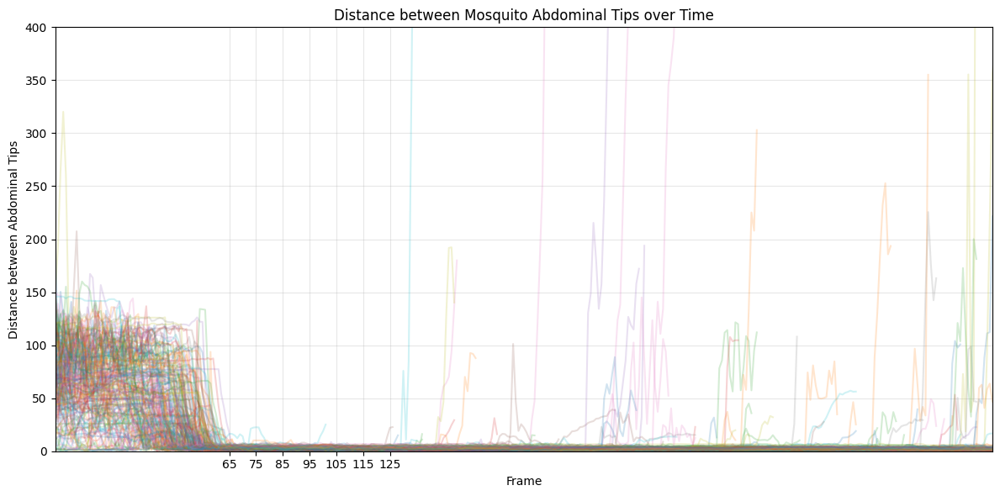

In [10]:
fig = plot_abdominal_distances(master_df)
plt.show()

In [11]:
def extract_close_contact_sequences(master_df, distance_threshold=15, min_frames=30, sequence_length=90):
    """
    Extracts sequences where mosquitoes maintain close contact, indicating potential mating behavior.
    The sequence starts when abdominal tips are consistently close and continues for a fixed duration.
    
    Close contact criteria:
    - Abdominal tips distance < 15 pixels
    - Maintained for at least 30 frames
    - Extracts 90 frames total once criteria are met
    """
    condition_met_info = []
    filtered_dfs = []
    
    for filename in master_df['filename'].unique():
        df_subset = master_df[master_df['filename'] == filename]
        distance_under_threshold_count = 0
        start_frame = None
        
        for index, row in df_subset.iterrows():
            distance = calculate_distance(row['abdo4_mosquito1'], row['abdo4_mosquito2'])
            
            if distance < distance_threshold:
                distance_under_threshold_count += 1
                if start_frame is None:
                    start_frame = row['frame']
                
                if distance_under_threshold_count >= min_frames:
                    end_frame = start_frame + sequence_length
                    filtered_df = df_subset[
                        (df_subset['frame'] >= start_frame) & 
                        (df_subset['frame'] <= end_frame)
                    ]
                    filtered_df['frame'] = filtered_df['frame'] - start_frame
                    filtered_dfs.append(filtered_df)
                    
                    condition_met_info.append({
                        'filename': filename,
                        'frame': start_frame,
                        'seconds': start_frame / 30.0
                    })
                    break
            else:
                distance_under_threshold_count = 0
                start_frame = None
    
    filtered_master_df = pd.concat(filtered_dfs, ignore_index=True)
    
    csv_folder = os.path.join(os.path.dirname(master_df['filename'].iloc[0]), 'CSV_dfs')
    filtered_master_csv_path = os.path.join(csv_folder, "filtered_master_dataframe.csv")
    filtered_master_df.to_csv(filtered_master_csv_path, index=False)
    
    condition_met_df = pd.DataFrame(condition_met_info)
    condition_met_csv_path = os.path.join(csv_folder, "condition_met_info.csv")
    condition_met_df.to_csv(condition_met_csv_path, index=False)
    
    print(f"Extracted {len(filtered_dfs)} sequences")
    return filtered_master_df, condition_met_df

filtered_master_df, condition_met_df = extract_close_contact_sequences(master_df)

C:\Users\jacop\AppData\Local\Temp\ipykernel_50464\1520430503.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['frame'] = filtered_df['frame'] - start_frame
C:\Users\jacop\AppData\Local\Temp\ipykernel_50464\1520430503.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['frame'] = filtered_df['frame'] - start_frame
C:\Users\jacop\AppData\Local\Temp\ipykernel_50464\1520430503.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try usin

Extracted 181 sequences


In [12]:
def apply_distance_threshold_filter(master_df, distance_threshold=20):
    """
    Filters out sequences where mosquitoes separate beyond a threshold distance.
    This helps identify and retain only consistent close-contact behaviors,
    removing sequences with temporary or unstable interactions.
    """
    filenames_to_exclude = []
    
    for filename in master_df['filename'].unique():
        df_subset = master_df[master_df['filename'] == filename]
        
        if any(calculate_distance(row['abdo4_mosquito1'], row['abdo4_mosquito2']) > distance_threshold 
               for _, row in df_subset.iterrows()):
            filenames_to_exclude.append(filename)
    
    final_filtered_df = master_df[~master_df['filename'].isin(filenames_to_exclude)]
    
    csv_folder = os.path.join(os.path.dirname(master_df['filename'].iloc[0]), 'CSV_dfs')
    final_filtered_csv_path = os.path.join(csv_folder, "final_filtered_master_dataframe.csv")
    final_filtered_df.to_csv(final_filtered_csv_path, index=False)
    
    print(f"Retained {len(master_df['filename'].unique()) - len(filenames_to_exclude)} sequences")
    return final_filtered_df

final_filtered_df = apply_distance_threshold_filter(filtered_master_df)

Retained 174 sequences


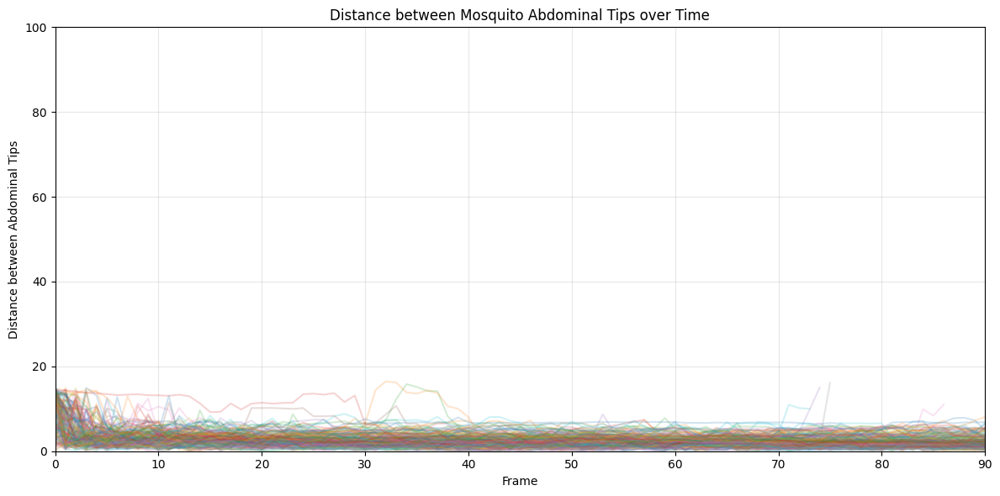

In [13]:
def plot_filtered_distances(master_df, max_frame=375, y_limit=100, x_limit=90):
    """
    Plots distances between mosquito abdominal tips for filtered close-contact sequences.
    Shows consistent proximity patterns after removing sequences with large separations.
    """
    fig, ax = plt.subplots(figsize=(12, 6))
    
    for filename in master_df['filename'].unique():
        df = master_df[
            (master_df['filename'] == filename) & 
            (master_df['frame'] <= max_frame)
        ]
        
        distances = df.apply(
            lambda row: calculate_distance(
                row['abdo4_mosquito1'], 
                row['abdo4_mosquito2']
            ), 
            axis=1
        )
        
        ax.plot(
            df['frame'], 
            distances, 
            label=filename.split('.')[0], 
            alpha=0.2
        )
    
    ax.set_xlabel('Frame')
    ax.set_ylabel('Distance between Abdominal Tips')
    ax.set_title('Distance between Mosquito Abdominal Tips over Time')
    
    ax.set_ylim(0, y_limit)
    ax.set_xlim(0, x_limit)
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    return fig

fig = plot_filtered_distances(final_filtered_df)
plt.show()

## Part 1: Calculating Angles Between Female and Male After Genital Contact

As a sanity check, plot the average position of all five body parts of all files from frame 0 to 90 to see whether there is any odd tracklet. The time window has been chosen by looking at the plot above. Note: sex is not assigned to individual mosquitoes yet, as here we ere not yet concerned with identity, but jsut with angles formed between the two mosquitoes.

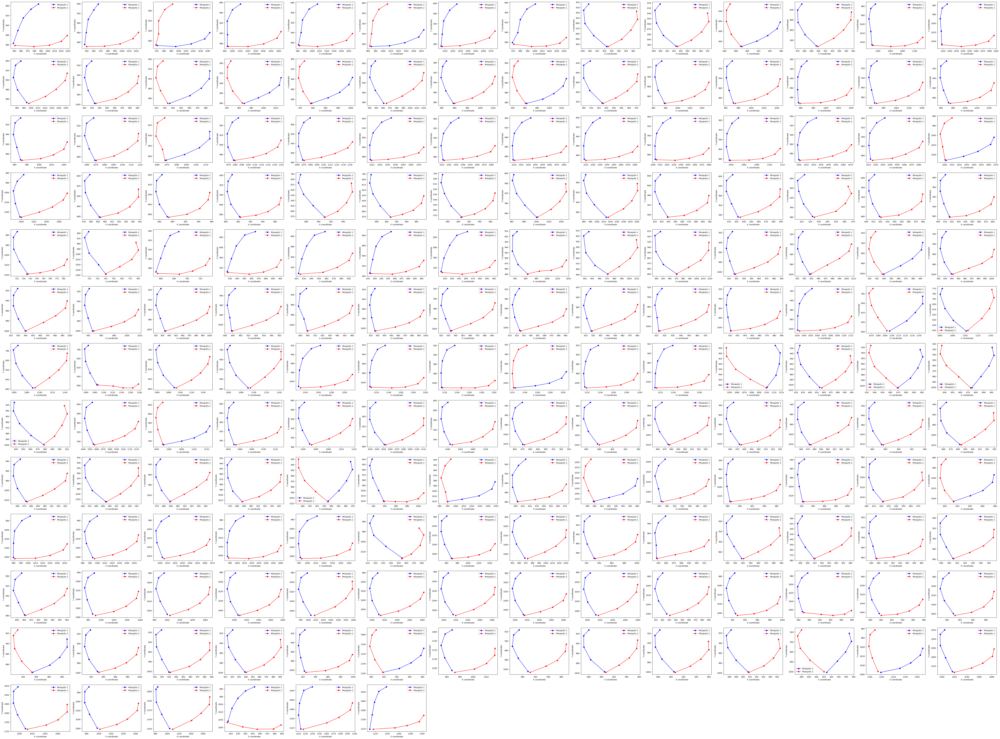

In [14]:
def plot_average_positions(master_df, num_columns=14, frame_range=(0, 90)):
    """
    Creates plots showing average body part positions for each recording.
    Each plot shows two mosquitoes' body segments connected by lines, giving a
    sense of their relative positioning and orientation during interaction.
    """
    unique_filenames = master_df['filename'].unique()
    num_files = len(unique_filenames)
    num_rows = math.ceil(num_files / num_columns)
    
    fig, axes = plt.subplots(num_rows, num_columns, figsize=(5 * num_columns, 4 * num_rows))
    fig.tight_layout(pad=3.0)
    axes = axes.flatten()
    
    body_parts = ['thorax', 'abdo1', 'abdo2', 'abdo3', 'abdo4']
    colors = {'mosquito1': 'blue', 'mosquito2': 'red'}
    
    for idx, filename in enumerate(unique_filenames):
        df = master_df[master_df['filename'] == filename].copy()
        df = df[(df['frame'] >= frame_range[0]) & (df['frame'] <= frame_range[1])]
        df.set_index('frame', inplace=True)
        
        avg_positions = {}
        for col in [col for col in df.columns if col not in ['filename', 'condition']]:
            avg_x = df[col].apply(lambda x: x[0]).mean()
            avg_y = df[col].apply(lambda x: x[1]).mean()
            avg_positions[col] = (avg_x, avg_y)
        
        for mosquito_num in [1, 2]:
            x_vals = [avg_positions[f'{part}_mosquito{mosquito_num}'][0] for part in body_parts]
            y_vals = [avg_positions[f'{part}_mosquito{mosquito_num}'][1] for part in body_parts]
            axes[idx].plot(x_vals, y_vals, marker='o', linestyle='-', 
                         color=colors[f'mosquito{mosquito_num}'], 
                         label=f'Mosquito {mosquito_num}')
        
        axes[idx].legend()
        axes[idx].set_xlabel('X coordinate')
        axes[idx].set_ylabel('Y coordinate')
        axes[idx].invert_yaxis()
    
    for idx in range(num_files, num_rows * num_columns):
        fig.delaxes(axes[idx])
    
    return fig

fig = plot_average_positions(final_filtered_df)
plt.show()

### Average Angle Per Condition

In [15]:
def get_avg_positions_for_file(df):
   """
   Calculates average position of each body part over a 90-frame window.
   Returns dictionary mapping each body part to its mean (x,y) coordinates.
   """
   df = df[(df['frame'] >= 0) & (df['frame'] <= 90)]
   avg_positions = {}

   body_part_cols = [col for col in df.columns 
                    if col not in ['filename', 'condition', 'frame']]
   
   for col in body_part_cols:
       avg_x = df[col].apply(lambda x: x[0]).mean()
       avg_y = df[col].apply(lambda x: x[1]).mean()
       avg_positions[col] = (avg_x, avg_y)

   return avg_positions

In [16]:
def compile_average_positions(master_df):
    """
    Compiles average body part positions across all recordings.
    Creates a dataframe where each row represents one recording's average positions.
    """
    all_avg_positions = []
    
    for filename in master_df['filename'].unique():
        subset_df = master_df[master_df['filename'] == filename]
        
        avg_positions = get_avg_positions_for_file(subset_df.copy())
        avg_positions['filename'] = filename
        avg_positions['condition'] = subset_df['condition'].iloc[0]
        
        all_avg_positions.append(avg_positions)

    return pd.DataFrame(all_avg_positions)

avg_position_df = compile_average_positions(final_filtered_df)

In [17]:
def calculate_angle(A, B, P):
   """
   Calculates the angle between three points using vectors.
   Returns angle in degrees between vectors AP and BP.
   """
   AP = (A[0] - P[0], A[1] - P[1])
   BP = (B[0] - P[0], B[1] - P[1])
   
   dot_product = AP[0]*BP[0] + AP[1]*BP[1]
   
   mag_AP = math.sqrt(AP[0]**2 + AP[1]**2)
   mag_BP = math.sqrt(BP[0]**2 + BP[1]**2)
   
   angle_rad = math.acos(dot_product / (mag_AP * mag_BP))
   angle_deg = math.degrees(angle_rad)
   
   return angle_deg

I use abdo4_mosquito1 as a pivot, in this case the sex of mosquito1 does not matter as we are only calculating the angle in the time window in which the abdominal tips are connected.

In [18]:
def get_avg_angles_for_file(df):
    """
    Calculates average angles between corresponding body parts of both mosquitoes,
    using abdo4 of mosquito 1 as the pivot point.
    """
    avg_positions = get_avg_positions_for_file(df)
    P = avg_positions['abdo4_mosquito1']
    
    angles = {}
    for body_part in ['thorax', 'abdo1', 'abdo2', 'abdo3', 'abdo4']:
        if body_part != 'abdo4':
            A = avg_positions[f'{body_part}_mosquito1']
            B = avg_positions[f'{body_part}_mosquito2']
            angles[f'{body_part}_angle'] = calculate_angle(A, B, P)
    
    return angles


In [19]:
data = []
all_avg_angles = []

for filename in final_filtered_df['filename'].unique():
   subset_df = final_filtered_df[(final_filtered_df['filename'] == filename) & 
                               (final_filtered_df['frame'] >= 0) & 
                               (final_filtered_df['frame'] <= 120)]
   
   avg_angles = get_avg_angles_for_file(subset_df.copy())
   avg_angles['filename'] = filename
   avg_angles['condition'] = subset_df['condition'].iloc[0]
   all_avg_angles.append(avg_angles)

avg_angle_df = pd.DataFrame(all_avg_angles)

As a sanity check, output the number of filenames in each condition and check if they match with the original set of .h5 files.

In [20]:
avg_angle_df.value_counts('condition')

condition
1    97
0    49
2    19
3     9
Name: count, dtype: int64

Assign condition names to numeric conditions for the plotting

In [21]:
body_parts = ['thorax', 'abdo1', 'abdo2', 'abdo3']
conditions = [0, 1, 2, 3]
condition_names = ['FM', 'EM', 'M', "V"]

condition_colors = plt.get_cmap('Pastel2').colors
condition_to_color = dict(zip(conditions, condition_colors))

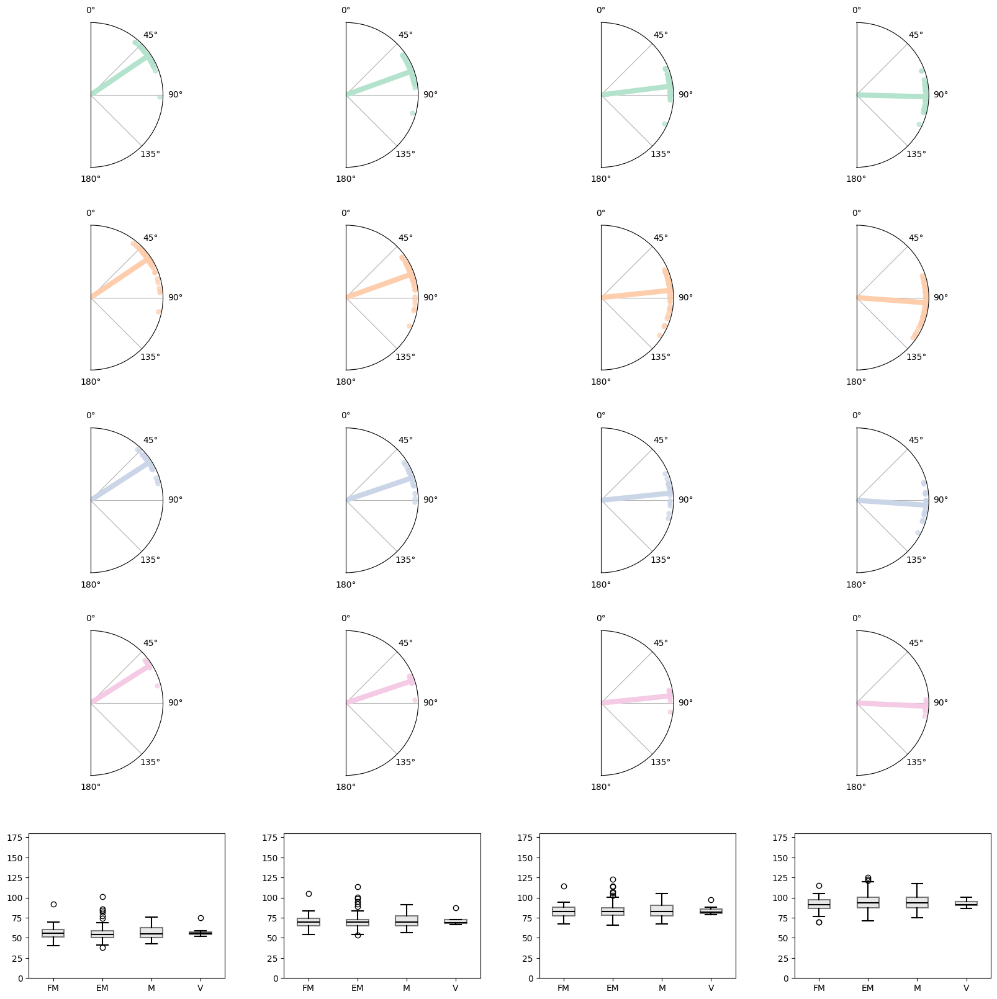

In [22]:
def create_angle_visualization(avg_angle_df, body_parts, conditions, condition_names, condition_to_color):
   """
   Creates a comprehensive visualization of angles between mosquito body parts.
   Combines polar plots for angle distribution and box plots for statistical comparison.
   """
   fig = plt.figure(figsize=(20, 20))
   gs = gridspec.GridSpec(5, 4, hspace=0.4, wspace=0.3)

   # Create polar plots for each body part and condition
   for i, part in enumerate(body_parts):
       for j, condition in enumerate(conditions):
           ax_polar = fig.add_subplot(gs[j, i], projection='polar')
           
           current_angles_df = avg_angle_df[
               (avg_angle_df['condition'] == condition) & 
               (~avg_angle_df[f'{part}_angle'].isnull())
           ]
           
           # Plot individual angles
           radii = np.ones(len(current_angles_df[f'{part}_angle']))
           theta = np.radians(current_angles_df[f'{part}_angle'])
           ax_polar.plot(theta, radii, 'o', 
                        color=condition_to_color[condition], 
                        alpha=0.7, markersize=5)
           
           # Plot mean angle vector
           avg_angle = np.radians(current_angles_df[f'{part}_angle'].mean())
           ax_polar.plot([0, avg_angle], [0, 1], 
                        color=condition_to_color[condition], lw=6)
           
           # Configure polar plot
           ax_polar.set_yticklabels([])
           ax_polar.set_yticks([])
           ax_polar.set_rlabel_position(-180)
           ax_polar.set_theta_zero_location('N')
           ax_polar.set_theta_direction(-1)
           ax_polar.set_thetamin(0)
           ax_polar.set_thetamax(180)

   # Create box plots for statistical comparison
   for i, part in enumerate(body_parts):
       ax_box = fig.add_subplot(gs[4, i])
       
       box_data = [
           avg_angle_df[
               (avg_angle_df['condition'] == condition) & 
               (~avg_angle_df[f'{part}_angle'].isnull())
           ][f'{part}_angle'] 
           for condition in conditions
       ]
       
       ax_box.boxplot(box_data, patch_artist=True,
                     boxprops=dict(facecolor='lightgray', linewidth=1.5, alpha=0.5),
                     whiskerprops=dict(linewidth=1.5),
                     capprops=dict(linewidth=1.5),
                     medianprops=dict(color='black', linewidth=1.5),
                     positions=range(len(conditions)))
       
       ax_box.set_xticks(range(len(conditions)))
       ax_box.set_xticklabels(condition_names)
       ax_box.set_ylim(0, 180)

   plt.savefig('angle_plot.pdf', format='pdf')
   return fig

# Create the visualization
fig = create_angle_visualization(avg_angle_df, body_parts, conditions, 
                              condition_names, condition_to_color)
plt.show()

###  Angle Dynamics Over Time

The next cell plots the angle between mosquitoes over the time window previously selected (65-120)

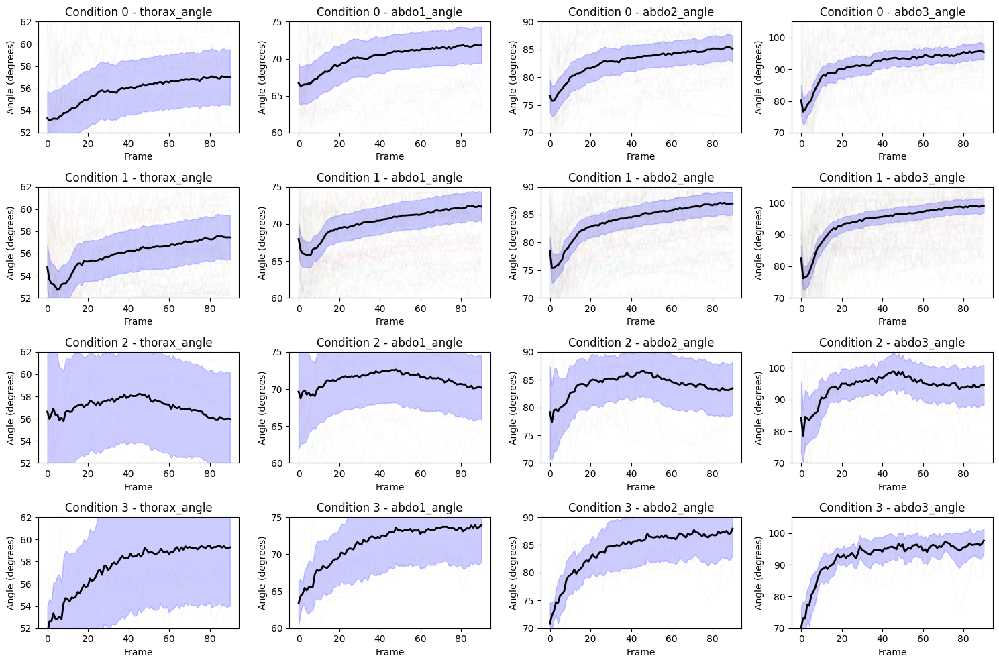

In [23]:
def create_angle_time_series(master_df, frame_range=(0, 120)):
   """
   Calculate and plot angles over time for each body part and condition.
   Creates time series of angles between corresponding body parts using abdo4 as pivot.
   """
   angle_data = []
   
   filtered_df = master_df[
       (master_df['frame'] >= frame_range[0]) & 
       (master_df['frame'] <= frame_range[1])
   ]
   
   for _, row in filtered_df.iterrows():
       pivot = row['abdo4_mosquito1']
       angles = {
           f'{part}_angle': calculate_angle(
               row[f'{part}_mosquito1'], 
               row[f'{part}_mosquito2'],
               pivot
           )
           for part in ['thorax', 'abdo1', 'abdo2', 'abdo3']
       }
       angles.update({
           'filename': row['filename'],
           'condition': row['condition'],
           'frame': row['frame']
       })
       angle_data.append(angles)
   
   return pd.DataFrame(angle_data)

def plot_angle_time_series(angle_df, y_limits=[(52, 62), (60, 75), (70, 90), (70, 105)]):
   """
   Creates grid plot of angle time series for each body part and condition.
   Includes individual trajectories and confidence intervals around the mean.
   """
   body_parts = ['thorax_angle', 'abdo1_angle', 'abdo2_angle', 'abdo3_angle']
   conditions = sorted(angle_df['condition'].unique())
   
   fig, axs = plt.subplots(len(conditions), len(body_parts), 
                          figsize=(15, 10), squeeze=False)
   
   for i, condition in enumerate(conditions):
       for j, (body_part, y_lim) in enumerate(zip(body_parts, y_limits)):
           df_filtered = angle_df[angle_df['condition'] == condition]
           
           for _, group in df_filtered.groupby('filename'):
               axs[i, j].plot(group['frame'], group[body_part],
                            alpha=0.02)
           
           avg = df_filtered.groupby('frame')[body_part].mean()
           ci = 1.96 * df_filtered.groupby('frame')[body_part].std() / \
                np.sqrt(df_filtered.groupby('frame')[body_part].count())
           
           axs[i, j].fill_between(avg.index,
                                (avg - ci).values,
                                (avg + ci).values,
                                color='b', alpha=0.2)
           axs[i, j].plot(avg.index, avg.values,
                         color='black', linewidth=2)
           
           axs[i, j].set_title(f'Condition {condition} - {body_part}')
           axs[i, j].set_xlabel('Frame')
           axs[i, j].set_ylabel('Angle (degrees)')
           axs[i, j].set_ylim(y_lim)
   
   plt.tight_layout()
   plt.show()

angle_df = create_angle_time_series(final_filtered_df)
plot_angle_time_series(angle_df)

In [25]:
def plot_single_angle_comparison(angle_df, body_part='abdo3_angle'):
    """
    Plot single body part angle comparison across conditions with confidence intervals.
    Shows temporal dynamics of angles between mosquito body parts overlaid for each condition.
    """
    plt.figure(figsize=(12, 8))
    conditions = sorted(angle_df['condition'].unique())
    colors = ['blue', 'red', 'green', 'purple'] 

    for condition, color in zip(conditions, colors):
        df_filtered = angle_df[angle_df['condition'] == condition]
        
        for _, group in df_filtered.groupby('filename'):
            plt.plot(group['frame'], group[body_part],
                    color='grey', alpha=0.05)
        
        avg = df_filtered.groupby('frame')[body_part].mean()
        ci = 1.96 * df_filtered.groupby('frame')[body_part].std() / \
             np.sqrt(df_filtered.groupby('frame')[body_part].count())
        
        plt.fill_between(avg.index, 
                        (avg - ci).values, 
                        (avg + ci).values, 
                        color=color, alpha=0.05)
        
        plt.plot(avg.index, avg.values, color=color,
                linewidth=2, label=f'Condition {condition}')

    plt.xlabel('Frame')
    plt.ylabel('Angle (degrees)')
    plt.title(f'{body_part} Over Time')
    plt.legend()
    plt.ylim(60, 110)
    plt.grid(True)
    plt.show()


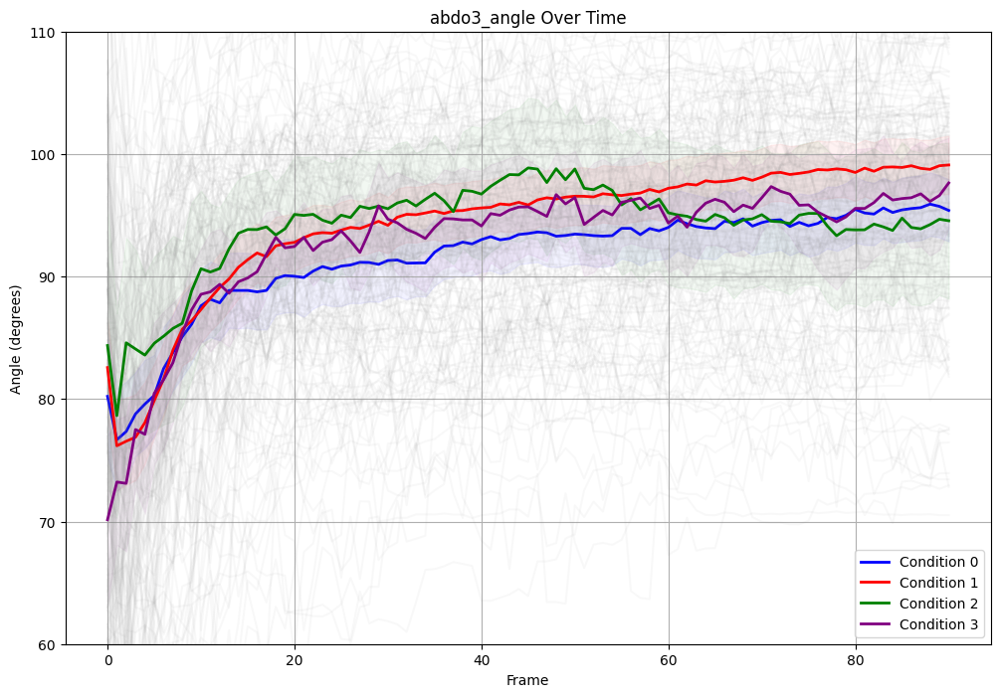

In [26]:
plot_single_angle_comparison(angle_df)

## Part 2: Pose Dynamics

The next cell assign sex to mosquitoes based on the average position of their thoraxes. The assumption is that females will have on average their thoraxes on the left (meaning at a lower x value) than males, as they are always facing the same orientation.

In [27]:
def determine_sex_for_files(df):
   """
   Determine sex of mosquitoes based on average x position and rename columns accordingly.
   Female is assumed to be the leftmost mosquito based on average thorax position.
   """
   results = []
   renamed_df = pd.DataFrame()

   for filename, group in df.groupby('filename'):
       avg_x1 = group['thorax_mosquito1'].apply(lambda x: x[0]).mean()
       avg_x2 = group['thorax_mosquito2'].apply(lambda x: x[0]).mean()
       
       sex_m1, sex_m2 = ('female', 'male') if avg_x1 < avg_x2 else ('male', 'female')
       
       results.append({
           'filename': filename,
           'sex_mosquito1': sex_m1,
           'sex_mosquito2': sex_m2
       })

       rename_schema = {
           f'{part}_mosquito{i}': f'{part}_{sex}'
           for part in ['thorax', 'abdo1', 'abdo2', 'abdo3', 'abdo4']
           for i, sex in [(1, sex_m1), (2, sex_m2)]
       }
       rename_schema.update({
           'sex_mosquito1': f'sex_{sex_m1}',
           'sex_mosquito2': f'sex_{sex_m2}'
       })
       
       renamed_df = pd.concat([renamed_df, group.rename(columns=rename_schema)])

   return renamed_df, pd.DataFrame(results)

master_df_sex_assigned, sex_assignments = determine_sex_for_files(final_filtered_df)

The next cell will compute the Bezier curve and plot them for each individual file

In [28]:
# Function to compute a Bezier curve point
def bezier_curve(points, t):
   """
   Calculate point on Bezier curve at parameter t using Bernstein polynomial.
   
   Points are weighted and summed based on binomial coefficients and the parameter t.
   Higher t values move along the curve from start to end.
   """
   n = len(points) - 1
   return sum(
       np.array(point) * comb(n, i) * (t ** i) * ((1 - t) ** (n - i))
       for i, point in enumerate(points)
   )

Next I plot individual filenames to check if the sex assignment has been succesful, all males should be on average on the right.

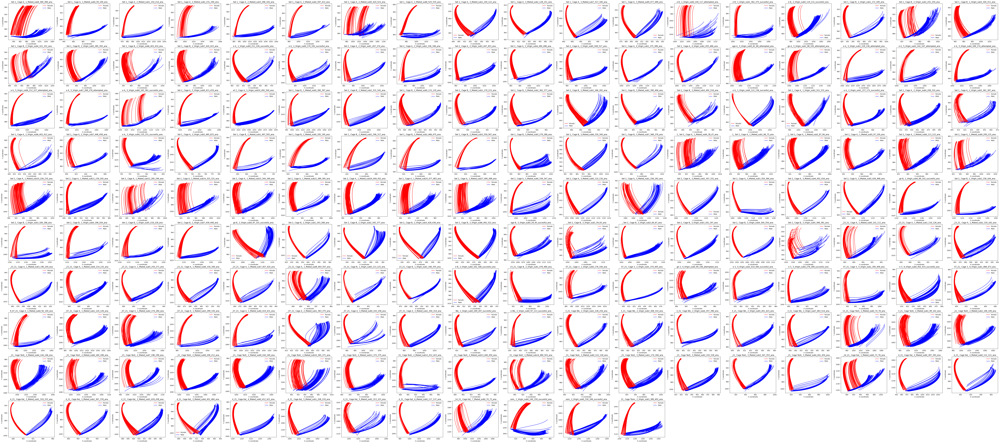

In [29]:
def plot_bezier_curves(master_df, num_columns=18):
   """
   Creates grid visualization of bezier curves representing male and female mosquito body shapes.
   Each subplot shows the smoothed body contours for one recording.
   """
   unique_filenames = master_df['filename'].unique()
   num_files = len(unique_filenames)
   num_rows = math.ceil(num_files / num_columns)

   fig, axes = plt.subplots(num_rows, num_columns, 
                           figsize=(5 * num_columns, 4 * num_rows))
   fig.tight_layout(pad=3.0)
   axes = axes.flatten()

   for idx, filename in enumerate(unique_filenames):
       start_frame = master_df[master_df['filename'] == filename].index.min()
       end_frame = master_df[master_df['filename'] == filename].index.max()
       frame_range = range(
           max(start_frame, start_frame + 0), 
           min(end_frame, start_frame + 90) + 1
       )

       for frame in frame_range:
           try:
               row = master_df.loc[frame]
               pos_female = [row['thorax_female']] + [row[f'abdo{i}_female'] for i in range(1, 5)]
               pos_male = [row['thorax_male']] + [row[f'abdo{i}_male'] for i in range(1, 5)]

               bezier_female = np.array([
                   bezier_curve(pos_female, t) for t in np.linspace(0, 1, 100)
               ])
               bezier_male = np.array([
                   bezier_curve(pos_male, t) for t in np.linspace(0, 1, 100)
               ])

               axes[idx].plot(bezier_female[:, 0], bezier_female[:, 1], color='red')
               axes[idx].plot(bezier_male[:, 0], bezier_male[:, 1], color='blue')
               
           except Exception as e:
               print(f"Error processing frame {frame} in filename {filename}: {e}")
               continue

       axes[idx].plot([], [], color='red', label='Female')
       axes[idx].plot([], [], color='blue', label='Male')
       axes[idx].legend(loc='best')
       axes[idx].set_xlabel('X coordinate')
       axes[idx].set_ylabel('Y coordinate')
       axes[idx].invert_yaxis()
       axes[idx].set_title(f"{filename[-45:-5]}")

   for idx in range(num_files, num_rows * num_columns):
       fig.delaxes(axes[idx])

   return fig

fig = plot_bezier_curves(master_df_sex_assigned)
plt.show()

In [30]:
def calculate_sinuosity(points):
    """
    Calculate sinuosity ratio (curve length / straight-line distance).
    Higher values indicate more curved/sinuous paths.
    """
    if len(points) < 2:
        return np.nan
    
    curve_len = sum(euclidean(p1, p2) 
                   for p1, p2 in zip(points[:-1], points[1:]))
    end_dist = euclidean(points[0], points[-1])
    
    return curve_len / end_dist if end_dist != 0 else np.nan

filtered_df = master_df_sex_assigned[(master_df_sex_assigned['frame'] >= 0) & 
                                   (master_df_sex_assigned['frame'] <= 91)]

sinuosity_data = []

for filename in filtered_df['filename'].unique():
    file_subset = filtered_df[filtered_df['filename'] == filename]
    
    for index, row in file_subset.iterrows():
        pos_female = [row['abdo2_female'], row['abdo3_female'], 
                     row['abdo4_female']]
        pos_male = [row['abdo2_male'], row['abdo3_male'], 
                   row['abdo4_male']]
        
        bezier_female = np.array([bezier_curve(pos_female, t) 
                                for t in np.linspace(0, 1, 100)])
        bezier_male = np.array([bezier_curve(pos_male, t) 
                              for t in np.linspace(0, 1, 100)])
        
        sinuosity_data.append({
            'frame': row['frame'],
            'filename': filename,
            'sinuosity_female': calculate_sinuosity(bezier_female),
            'sinuosity_male': calculate_sinuosity(bezier_male),
            'condition': row['condition']
        })

sinuosity_df = pd.DataFrame(sinuosity_data)

In [31]:
sinuosity_df.head()

,frame,filename,sinuosity_female,sinuosity_male,condition
0,0,labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mat...,1.002105,1.000000,1
1,1,labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mat...,1.000510,1.000419,1
2,2,labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mat...,1.000484,1.000045,1
3,3,labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mat...,1.000369,1.000365,1
4,4,labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mat...,1.000409,1.000912,1


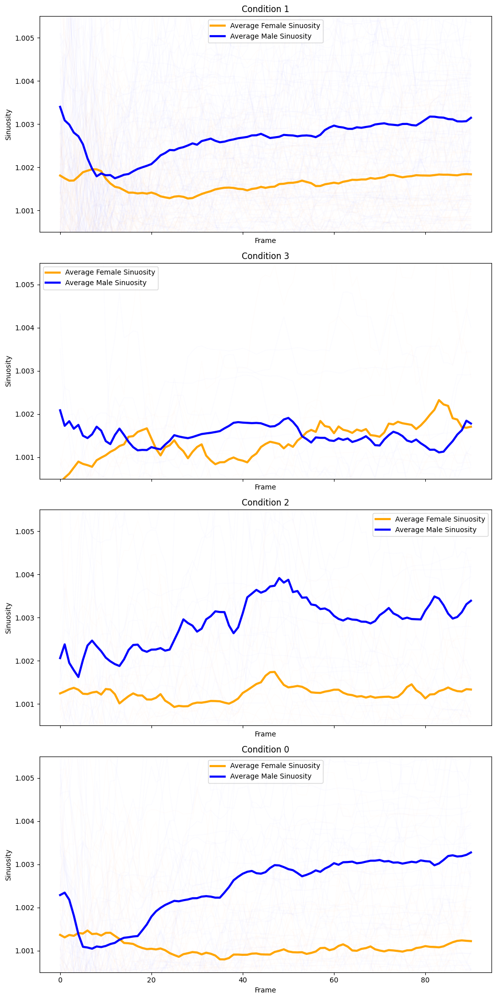

In [34]:
def plot_sinuosity_dynamics(df, window_size=3, y_limits=(1.0005, 1.0055)):
   """
   Plot sinuosity dynamics for males and females across conditions.
   """
   conditions = df['condition'].unique()
   fig, axs = plt.subplots(len(conditions), 1, 
                          figsize=(10, 5 * len(conditions)), 
                          sharex=True)
   axs = [axs] if len(conditions) == 1 else axs
   
   for ax, condition in zip(axs, conditions):
       condition_df = df[df['condition'] == condition]
       
       for filename in condition_df['filename'].unique():
           file_df = condition_df[condition_df['filename'] == filename]
           
           for sex, color in [('female', 'orange'), ('male', 'blue')]:
               smoothed = file_df[f'sinuosity_{sex}'].rolling(
                   window=window_size, min_periods=1).mean()
               ax.plot(file_df['frame'], smoothed, 
                      color=color, alpha=0.01)
       
       for sex, color in [('female', 'orange'), ('male', 'blue')]:
           avg = condition_df.groupby('frame')[f'sinuosity_{sex}'].mean().rolling(
               window=window_size, min_periods=1).mean()
           ax.plot(avg.index, avg, color=color, linewidth=3,
                  label=f'Average {sex.title()} Sinuosity')

       ax.set_title(f'Condition {condition}')
       ax.set_xlabel('Frame')
       ax.set_ylabel('Sinuosity')
       ax.set_ylim(y_limits)
       ax.legend()

   plt.savefig('sinuosity_dynamics_plot.pdf', format='pdf')
   plt.tight_layout()
   plt.show()

plot_sinuosity_dynamics(sinuosity_df)

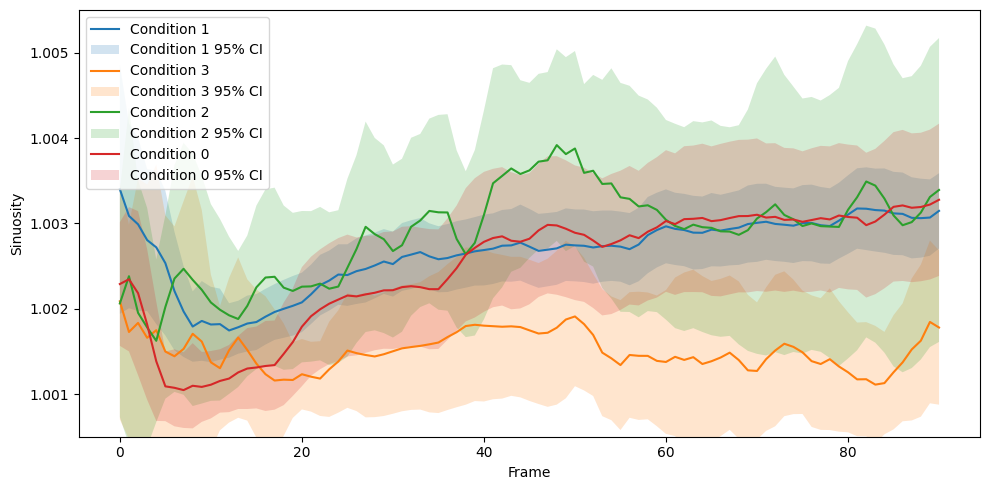

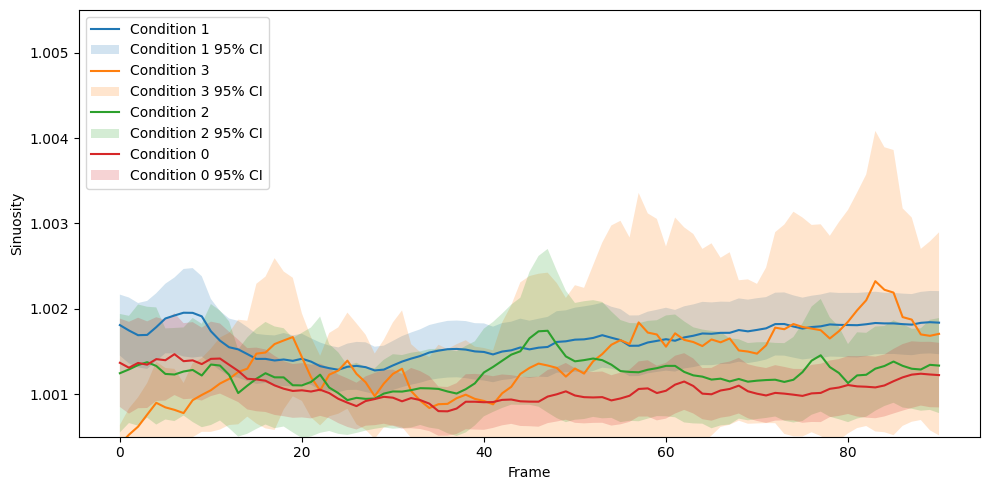

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import sem

def plot_male_sinuosity(df, window_size=3, y_limits=(1.0005, 1.0055)):
    """
    Plot sinuosity dynamics for males across conditions with confidence intervals.
    """
    conditions = df['condition'].unique()
    fig, axs = plt.subplots(1, 1, figsize=(10, 5))

    for condition in conditions:
        condition_df = df[df['condition'] == condition]
        avg = condition_df.groupby('frame')['sinuosity_male'].mean().rolling(
            window=window_size, min_periods=1).mean()
        std_err = condition_df.groupby('frame')['sinuosity_male'].apply(lambda x: sem(x)).rolling(
            window=window_size, min_periods=1).mean()
        axs.plot(avg.index, avg, label=f'Condition {condition}')
        axs.fill_between(avg.index, avg - 1.96 * std_err, avg + 1.96 * std_err, 
                         alpha=0.2, label=f'Condition {condition} 95% CI')

    axs.set_xlabel('Frame')
    axs.set_ylabel('Sinuosity')
    axs.set_ylim(y_limits)
    axs.legend()
    plt.savefig('male_sinuosity_dynamics.pdf', format='pdf')
    plt.tight_layout()
    plt.show()

def plot_female_sinuosity(df, window_size=3, y_limits=(1.0005, 1.0055)):
    """
    Plot sinuosity dynamics for females across conditions with confidence intervals.
    """
    conditions = df['condition'].unique()
    fig, axs = plt.subplots(1, 1, figsize=(10, 5))

    for condition in conditions:
        condition_df = df[df['condition'] == condition]
        avg = condition_df.groupby('frame')['sinuosity_female'].mean().rolling(
            window=window_size, min_periods=1).mean()
        std_err = condition_df.groupby('frame')['sinuosity_female'].apply(lambda x: sem(x)).rolling(
            window=window_size, min_periods=1).mean()
        axs.plot(avg.index, avg, label=f'Condition {condition}')
        axs.fill_between(avg.index, avg - 1.96 * std_err, avg + 1.96 * std_err, 
                         alpha=0.2, label=f'Condition {condition} 95% CI')

    axs.set_xlabel('Frame')
    axs.set_ylabel('Sinuosity')
    axs.set_ylim(y_limits)
    axs.legend()
    plt.savefig('female_sinuosity_dynamics.pdf', format='pdf')
    plt.tight_layout()
    plt.show()

# Plot male and female sinuosity dynamics
plot_male_sinuosity(sinuosity_df)
plot_female_sinuosity(sinuosity_df)

## Part 3: Relating Angles to Postural Dynamics

I merge the abdo3 (abdominal tip) angle and sinuosity dataframe into a single merged df.

In [36]:
# Merge sinuosity and angle data to analyze relationships between curvature and positioning
merged_df = pd.merge(sinuosity_df, 
                   angle_df[['filename', 'frame', 'abdo3_angle', 'condition']], 
                   on=['filename', 'frame', 'condition'], 
                   how='inner')

In [37]:
merged_df.head()

,frame,filename,sinuosity_female,sinuosity_male,condition,abdo3_angle
0,0,labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mat...,1.002105,1.000000,1,89.094208
1,1,labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mat...,1.000510,1.000419,1,84.089002
2,2,labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mat...,1.000484,1.000045,1,77.699186
3,3,labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mat...,1.000369,1.000365,1,79.568580
4,4,labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mat...,1.000409,1.000912,1,81.780097


In [39]:
def calculate_covariances(merged_df):
    """
    Calculates frame-wise covariances between abdominal angle and sinuosity
    for both male and female mosquitoes.
    """
    covariances = []
    
    for condition in sorted(merged_df['condition'].unique()):
        condition_df = merged_df[merged_df['condition'] == condition]
        
        for frame in range(0, 91):
            frame_df = condition_df[condition_df['frame'] == frame]
            
            if len(frame_df) > 1:
                cov_male = np.cov(frame_df['abdo3_angle'], 
                                frame_df['sinuosity_male'], ddof=0)[0, 1]
                cov_female = np.cov(frame_df['abdo3_angle'], 
                                  frame_df['sinuosity_female'], ddof=0)[0, 1]
            else:
                cov_male = np.nan
                cov_female = np.nan
            
            for _, row in frame_df.iterrows():
                covariances.append({
                    'filename': row['filename'],
                    'frame': frame,
                    'condition': condition,
                    'covariance_male': cov_male,
                    'covariance_female': cov_female
                })
    
    covariance_df = pd.DataFrame(covariances)
    return pd.merge(merged_df, covariance_df, 
                   on=['filename', 'frame', 'condition'], 
                   how='left')

# Add covariance columns to merged_df
merged_df = calculate_covariances(merged_df)

In [40]:
merged_df.head()

,frame,filename,sinuosity_female,sinuosity_male,condition,abdo3_angle,covariance_male,covariance_female
0,0,labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mat...,1.002105,1.000000,1,89.094208,-0.069627,0.015174
1,1,labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mat...,1.000510,1.000419,1,84.089002,-0.024774,0.010349
2,2,labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mat...,1.000484,1.000045,1,77.699186,-0.031265,0.009633
3,3,labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mat...,1.000369,1.000365,1,79.568580,-0.041692,0.005963
4,4,labels_v001_000_08_19_21_ Set 1_ Cage A_ 1_Mat...,1.000409,1.000912,1,81.780097,-0.042976,0.005152


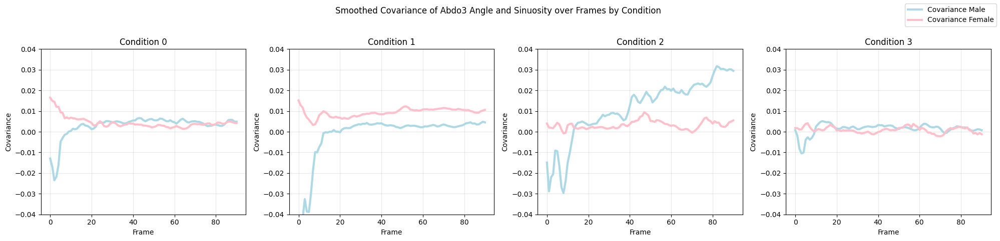

In [42]:
def plot_covariance_dynamics(merged_df):
   """
   Creates subplot grid showing smoothed covariance dynamics with confidence intervals
   between abdominal angle and sinuosity for each condition.
   """
   conditions = sorted(merged_df['condition'].unique())
   fig, axs = plt.subplots(1, len(conditions), figsize=(20, 5))
   
   for i, condition in enumerate(conditions):
       condition_df = merged_df[merged_df['condition'] == condition]
       
       # Calculate mean and standard error for each frame
       frame_stats_male = condition_df.groupby('frame').agg({
           'covariance_male': ['mean', 'sem']
       })
       frame_stats_female = condition_df.groupby('frame').agg({
           'covariance_female': ['mean', 'sem']
       })
       
       # Smooth the statistics
       male_mean = frame_stats_male[('covariance_male', 'mean')].rolling(window=3, min_periods=1).mean()
       male_sem = frame_stats_male[('covariance_male', 'sem')].rolling(window=3, min_periods=1).mean()
       
       female_mean = frame_stats_female[('covariance_female', 'mean')].rolling(window=3, min_periods=1).mean()
       female_sem = frame_stats_female[('covariance_female', 'sem')].rolling(window=3, min_periods=1).mean()
       
       # Plot means and confidence intervals
       axs[i].plot(male_mean.index, male_mean, 
                  label='Covariance Male', color='lightblue', linewidth=3)
       axs[i].fill_between(male_mean.index, 
                         male_mean - 1.96 * male_sem,
                         male_mean + 1.96 * male_sem,
                         color='lightblue', alpha=0.2)
       
       axs[i].plot(female_mean.index, female_mean,
                  label='Covariance Female', color='pink', linewidth=3)
       axs[i].fill_between(female_mean.index,
                         female_mean - 1.96 * female_sem,
                         female_mean + 1.96 * female_sem,
                         color='pink', alpha=0.2)
       
       axs[i].set_title(f'Condition {condition}')
       axs[i].set_xlabel('Frame')
       axs[i].set_ylabel('Covariance')
       axs[i].set_ylim([-0.04, 0.04])
       axs[i].grid(True, alpha=0.3)
   
   handles, labels = axs[-1].get_legend_handles_labels()
   fig.legend(handles, labels, loc='upper right')
   plt.suptitle('Smoothed Covariance of Abdo3 Angle and Sinuosity over Frames by Condition')
   
   plt.tight_layout(rect=[0, 0.03, 1, 0.95])
   plt.savefig('covariance_dynamics_plot.pdf', format='pdf')
   plt.show()

plot_covariance_dynamics(merged_df)

C:\Users\jacop\AppData\Local\Temp\ipykernel_50464\512389445.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  condition_df['time'] = condition_df['frame'] / 30.0
C:\Users\jacop\AppData\Local\Temp\ipykernel_50464\512389445.py:76: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  std_err_cov = cov_smoothed.rolling(window=3, min_periods=1).apply(lambda x: sem(x[~np.isnan(x)]))
C:\Users\jacop\AppData\Local\Temp\ipykernel_50464\512389445.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/

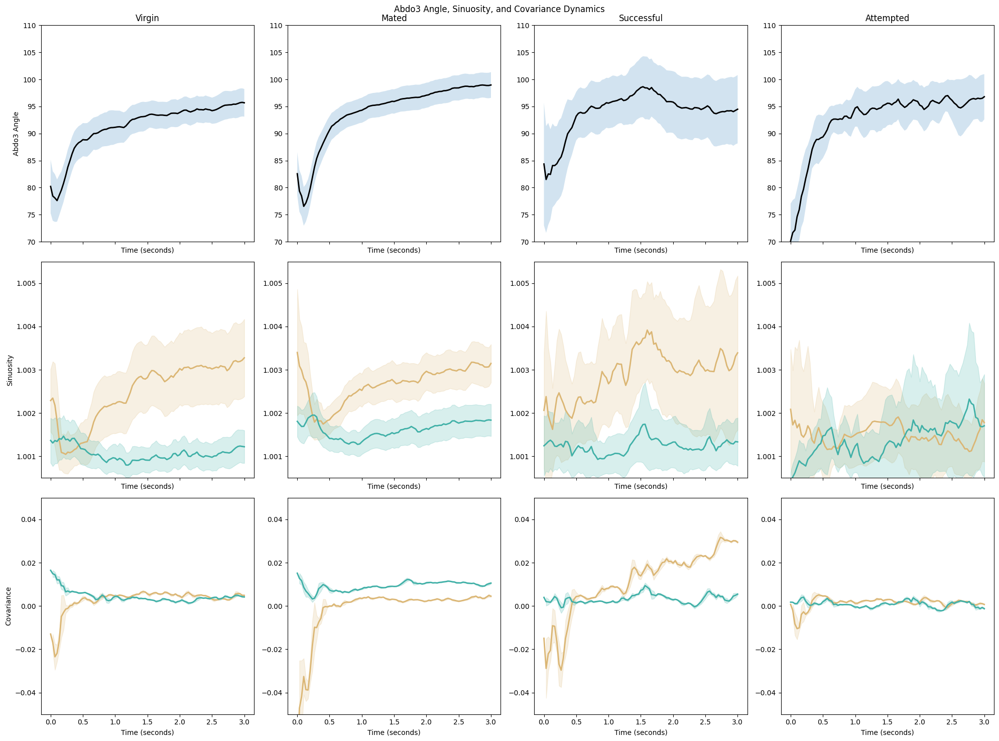

In [44]:
def plot_dynamics_summary(filtered_df, conditions):
   """
   Creates a comprehensive visualization of angle, sinuosity, and covariance dynamics
   across conditions with confidence intervals.
   Time is converted from frames to seconds assuming 30 fps recording rate.
   """
   fig, axs = plt.subplots(3, len(conditions), figsize=(20, 15), sharex='col')

   male_color = '#DBB674'
   female_color = '#40B0A7'
   
   condition_names = {
       0: 'Virgin',
       1: 'Mated',
       2: 'Successful',
       3: 'Attempted'
   }

   for i, condition in enumerate(sorted(conditions)):
       condition_df = filtered_df[filtered_df['condition'] == condition]
       
       # Convert frames to seconds
       condition_df['time'] = condition_df['frame'] / 30.0

       # Calculate and plot means and confidence intervals
       avg_abdo3 = condition_df.groupby('time')['abdo3_angle'].mean().rolling(window=3, min_periods=1).mean()
       std_err_abdo3 = condition_df.groupby('time')['abdo3_angle'].apply(
           lambda x: sem(x[~np.isnan(x)])).rolling(window=3, min_periods=1).mean()
       
       avg_sinuosity_male = condition_df.groupby('time')['sinuosity_male'].mean().rolling(window=3, min_periods=1).mean()
       avg_sinuosity_female = condition_df.groupby('time')['sinuosity_female'].mean().rolling(window=3, min_periods=1).mean()
       
       std_err_sinuosity_male = condition_df.groupby('time')['sinuosity_male'].apply(
           lambda x: sem(x[~np.isnan(x)])).rolling(window=3, min_periods=1).mean()
       std_err_sinuosity_female = condition_df.groupby('time')['sinuosity_female'].apply(
           lambda x: sem(x[~np.isnan(x)])).rolling(window=3, min_periods=1).mean()

       # Plot angle dynamics
       axs[0, i].plot(avg_abdo3.index, avg_abdo3, color='black', linewidth=2)
       axs[0, i].fill_between(avg_abdo3.index, 
                            avg_abdo3 - 1.96 * std_err_abdo3, 
                            avg_abdo3 + 1.96 * std_err_abdo3, alpha=0.2)
       axs[0, i].set_ylim(70, 110)

       # Plot sinuosity dynamics
       axs[1, i].plot(avg_sinuosity_male.index, avg_sinuosity_male, color=male_color, linewidth=2)
       axs[1, i].plot(avg_sinuosity_female.index, avg_sinuosity_female, color=female_color, linewidth=2)
       axs[1, i].fill_between(avg_sinuosity_male.index, 
                            avg_sinuosity_male - 1.96 * std_err_sinuosity_male,
                            avg_sinuosity_male + 1.96 * std_err_sinuosity_male, 
                            alpha=0.2, color=male_color)
       axs[1, i].fill_between(avg_sinuosity_female.index, 
                            avg_sinuosity_female - 1.96 * std_err_sinuosity_female,
                            avg_sinuosity_female + 1.96 * std_err_sinuosity_female, 
                            alpha=0.2, color=female_color)
       axs[1, i].set_ylim(1.0005, 1.0055)

       # Calculate and plot covariance
       times = np.arange(0, 91) / 30.0  # Convert frames to seconds
       covariances = []
       for frame in range(0, 91):
           frame_df = condition_df[condition_df['frame'] == frame]
           if len(frame_df) > 1:
               cov_male = np.cov(frame_df['abdo3_angle'], frame_df['sinuosity_male'], ddof=0)[0, 1]
               cov_female = np.cov(frame_df['abdo3_angle'], frame_df['sinuosity_female'], ddof=0)[0, 1]
           else:
               cov_male = cov_female = np.nan
           covariances.append({
               'time': frame / 30.0,
               'male': cov_male,
               'female': cov_female
           })

       cov_df = pd.DataFrame(covariances).set_index('time')
       cov_smoothed = cov_df.rolling(window=3, min_periods=1).mean()
       std_err_cov = cov_smoothed.rolling(window=3, min_periods=1).apply(lambda x: sem(x[~np.isnan(x)]))

       axs[2, i].plot(cov_smoothed.index, cov_smoothed['male'], color=male_color, linewidth=2)
       axs[2, i].plot(cov_smoothed.index, cov_smoothed['female'], color=female_color, linewidth=2)
       axs[2, i].fill_between(cov_smoothed.index, 
                            cov_smoothed['male'] - 1.96 * std_err_cov['male'],
                            cov_smoothed['male'] + 1.96 * std_err_cov['male'], 
                            alpha=0.2, color=male_color)
       axs[2, i].fill_between(cov_smoothed.index, 
                            cov_smoothed['female'] - 1.96 * std_err_cov['female'],
                            cov_smoothed['female'] + 1.96 * std_err_cov['female'], 
                            alpha=0.2, color=female_color)
       axs[2, i].set_ylim(-0.05, 0.05)

   # Set labels and titles
   for ax, condition in zip(axs[0], sorted(conditions)):
       ax.set_title(condition_names[condition])
   for ax in axs.flat:
       ax.set_xlabel('Time (seconds)')
   axs[0, 0].set_ylabel('Abdo3 Angle')
   axs[1, 0].set_ylabel('Sinuosity')
   axs[2, 0].set_ylabel('Covariance')

   plt.suptitle('Abdo3 Angle, Sinuosity, and Covariance Dynamics')
   plt.tight_layout()
   plt.savefig('dynamics_plot.pdf', format='pdf')
   plt.show()

# Filter and plot
filtered_df = merged_df[(merged_df['frame'] >= 0) & (merged_df['frame'] <= 90)]
conditions = filtered_df['condition'].unique()
plot_dynamics_summary(filtered_df, conditions)